In [1]:
# import tensorflow as tf
# physical_devices = tf.config.list_physical_devices('GPU') 
# tf.config.experimental.set_memory_growth(physical_devices[0], True)

# Object Detection



### Применение обученой сети inception_resnet_v2 для детекции объектов на изображении:

##### Взято из 
https://www.tensorflow.org/hub/tutorials/object_detection

In [2]:
import tensorflow as tf
import tensorflow_hub as hub
import gc

# For downloading the image.
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# For drawing onto the image.
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# For measuring the inference time.
import time

# Print Tensorflow version
print(tf.__version__)

# Check available GPU devices.
print("The following GPU devices are available: %s" % tf.test.gpu_device_name())

2.1.0
The following GPU devices are available: /device:GPU:0



Функции для загрузки изображений и для визуализации.
Код визуализации, адаптированный из API обнаружения объектов TF для простейшей требуемой функциональности.

In [3]:
def display_image(image):
    fig = plt.figure(figsize=(20, 15))
    plt.grid(False)
    plt.imshow(image)


def download_and_resize_image(url, new_width=1280, new_height=856,
                              display=True):
    _, filename = tempfile.mkstemp(suffix=".jpg")
    response = urlopen(url)
    image_data = response.read()
    image_data = BytesIO(image_data)
    pil_image = Image.open(image_data)
    pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
    pil_image_rgb = pil_image.convert("RGB")
    pil_image_rgb.save(filename, format="JPEG", quality=90)
    print("Image downloaded to %s." % filename)
    if display:
        display_image(pil_image)
    return filename


def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
    """Adds a bounding box to an image."""
    draw = ImageDraw.Draw(image)
    im_width, im_height = image.size
    (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
    draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
    display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
    total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

    if top > total_display_str_height:
        text_bottom = top
    else:
        text_bottom = top + total_display_str_height
  # Reverse list and print from bottom to top.
    for display_str in display_str_list[::-1]:
        text_width, text_height = font.getsize(display_str)
        margin = np.ceil(0.05 * text_height)
        draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
        draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
        text_bottom -= text_height - 2 * margin


def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
    """Overlay labeled boxes on an image with formatted scores and label names."""
    colors = list(ImageColor.colormap.values())
 
    try:
        font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
    except IOError:
        print("Font not found, using default font.")
        font = ImageFont.load_default()

    for i in range(min(boxes.shape[0], max_boxes)):
        if scores[i] >= min_score:
            ymin, xmin, ymax, xmax = tuple(boxes[i])
            display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
            color = colors[hash(class_names[i]) % len(colors)]
            image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
            draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
            np.copyto(image, np.array(image_pil))
    return image


#### Модули обнаружения объекта:



In [4]:
# загрузка с сайта:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1" 
# "https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1" - мобильный.

# локальная загрузка
# module_handle = 'faster_rcnn_openimages_v4_inception_resnet_v2_1'

detector = hub.load(module_handle).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [5]:
def load_img(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    return img

In [6]:
def run_detector(detector, path):
    img = load_img(path)

    converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
    start_time = time.time()
    result = detector(converted_img)
    end_time = time.time()

    result = {key:value.numpy() for key,value in result.items()}

    print("Found %d objects." % len(result["detection_scores"]))
    print("Inference time: ", end_time-start_time)

    image_with_boxes = draw_boxes(
          img.numpy(), result["detection_boxes"],
          result["detection_class_entities"], result["detection_scores"])

    display_image(image_with_boxes)

In [13]:
image_urls = [
    "https://arturpaikin.com/media/new-york/IMG_2434.jpg",
    'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSwnuSQ2whPnVcThuZsCk0WLEHwIADsdZ3BUzKFHSMAAEUAk8_f&s',
    'https://lh3.googleusercontent.com/proxy/SiqU-IEHdla8UN75AutSIg7x91lCX1mVIZp4DUxhBSFCIYkemhFS3NujUDXgWYoDSLQzB111Q5Mi_sh2W5nbUHfQ9QZfopGdrFZcFnrq0_R4D_VDVa3Y6T1DWia3812uxMKP-w',
    'https://lh3.googleusercontent.com/proxy/keNINViVvpKyrKO7x8eQfJ5wtbD_FW-R76qcyMBjUXE5ItwAU0mrmilb7bUQrHTMBQdl8poIhSIWZ1c',
  ]



In [14]:
def detect_img(image_url, detector=detector):
    start_time = time.time()
    image_path = download_and_resize_image(image_url, 1280, 856)
#     image_path = download_and_resize_image(image_url, 640, 480)
    run_detector(detector, image_path)
    end_time = time.time()
    print("Inference time:",start_time-end_time)

### Детекция объектов

Image downloaded to C:\Users\37529\AppData\Local\Temp\tmprar89r3y.jpg.
Found 100 objects.
Inference time:  1.1011242866516113
Font not found, using default font.
Inference time: -1.482170820236206


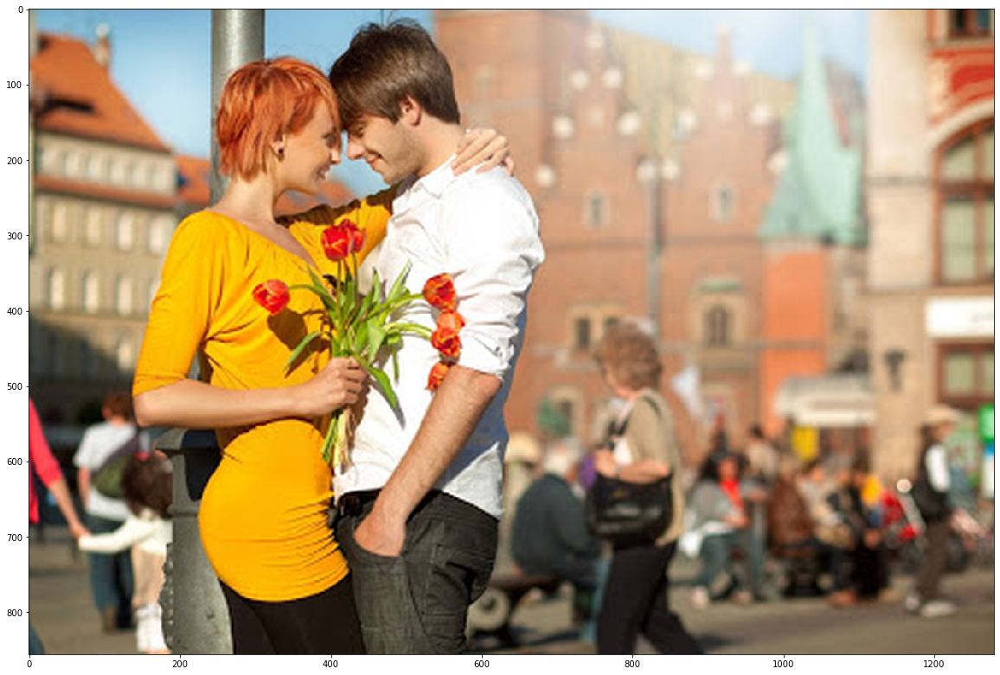

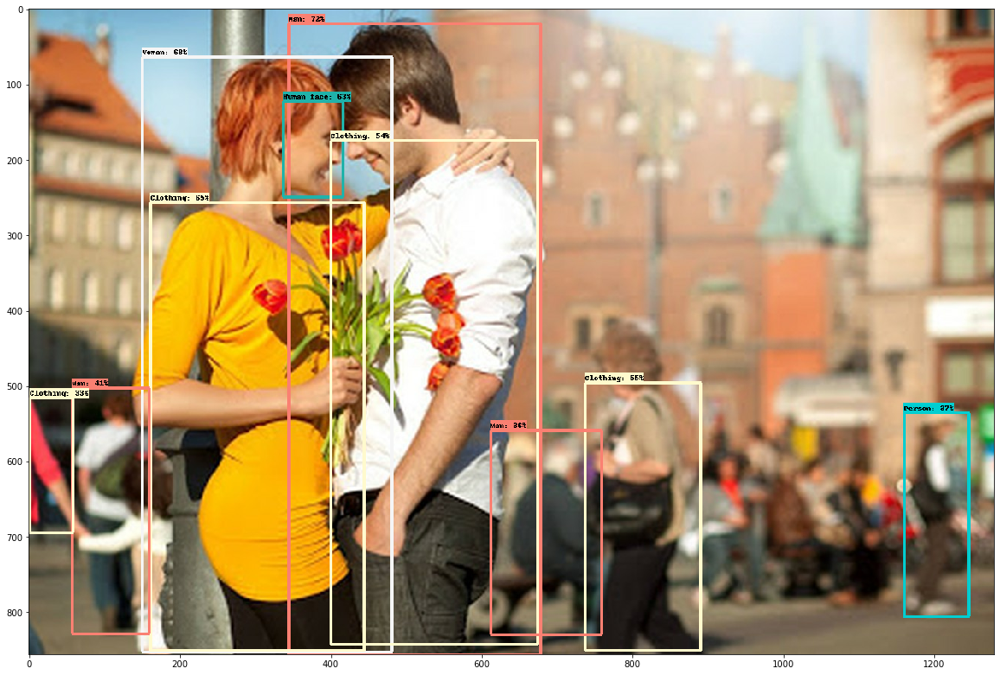

In [15]:
detect_img(image_urls[2])

In [16]:
gc.collect()

7745

Image downloaded to C:\Users\37529\AppData\Local\Temp\tmpbmci5ef0.jpg.
Found 100 objects.
Inference time:  1.0802454948425293
Font not found, using default font.
Inference time: -1.9533185958862305
Image downloaded to C:\Users\37529\AppData\Local\Temp\tmpblrf94wj.jpg.
Found 100 objects.
Inference time:  1.1270544528961182
Font not found, using default font.
Inference time: -1.4928131103515625
Image downloaded to C:\Users\37529\AppData\Local\Temp\tmp0p5ub34d.jpg.
Found 100 objects.
Inference time:  1.0985476970672607
Font not found, using default font.
Inference time: -1.5104424953460693
Image downloaded to C:\Users\37529\AppData\Local\Temp\tmppaex0au5.jpg.
Found 100 objects.
Inference time:  1.000002384185791
Font not found, using default font.
Inference time: -1.3929634094238281


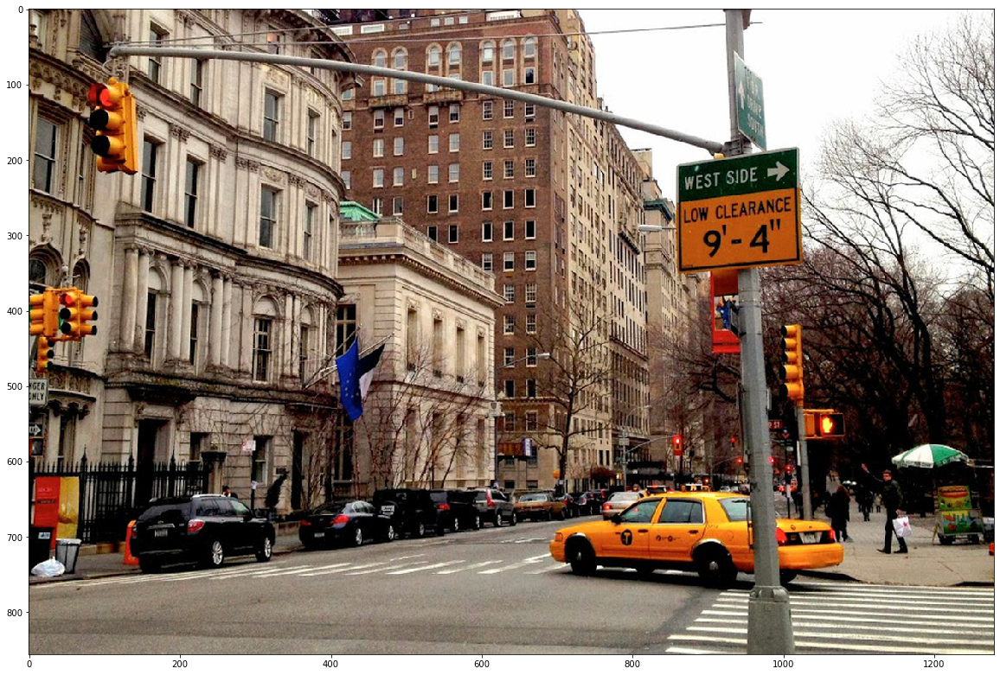

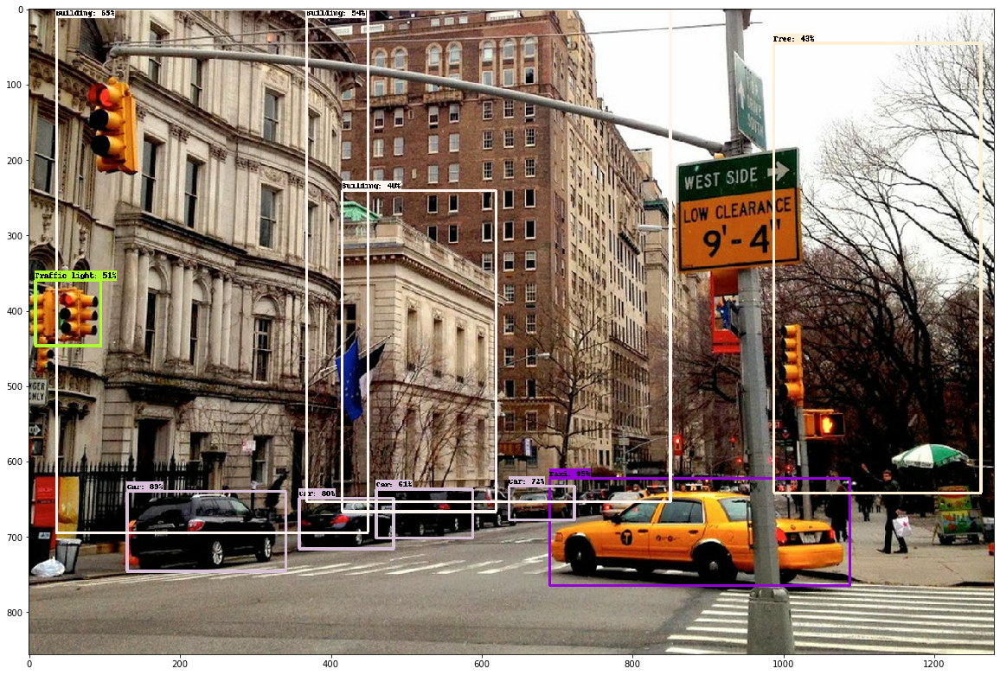

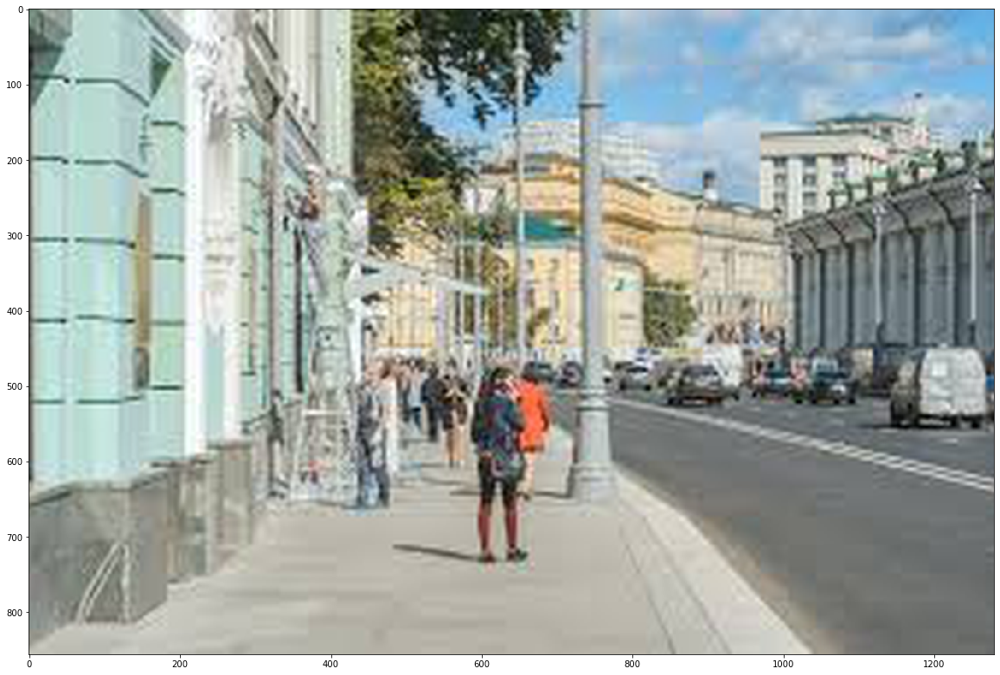

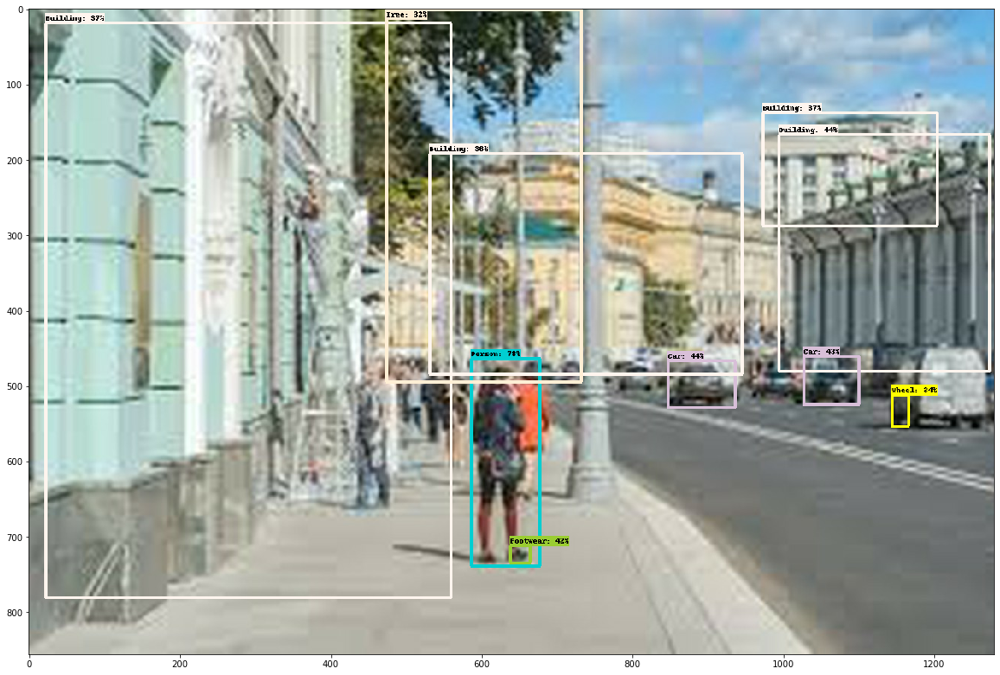

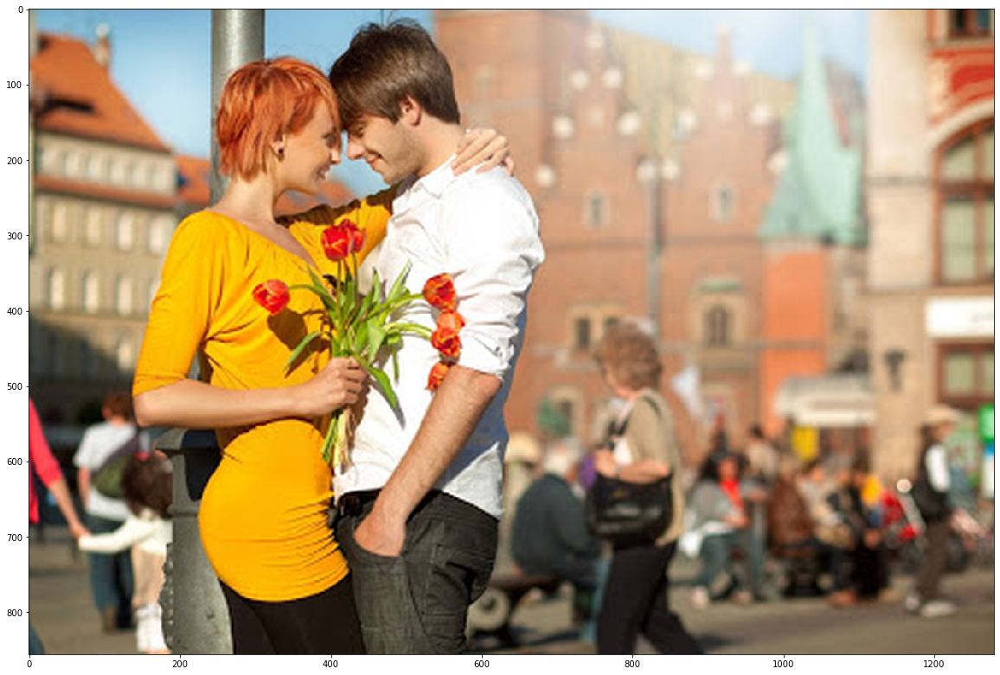

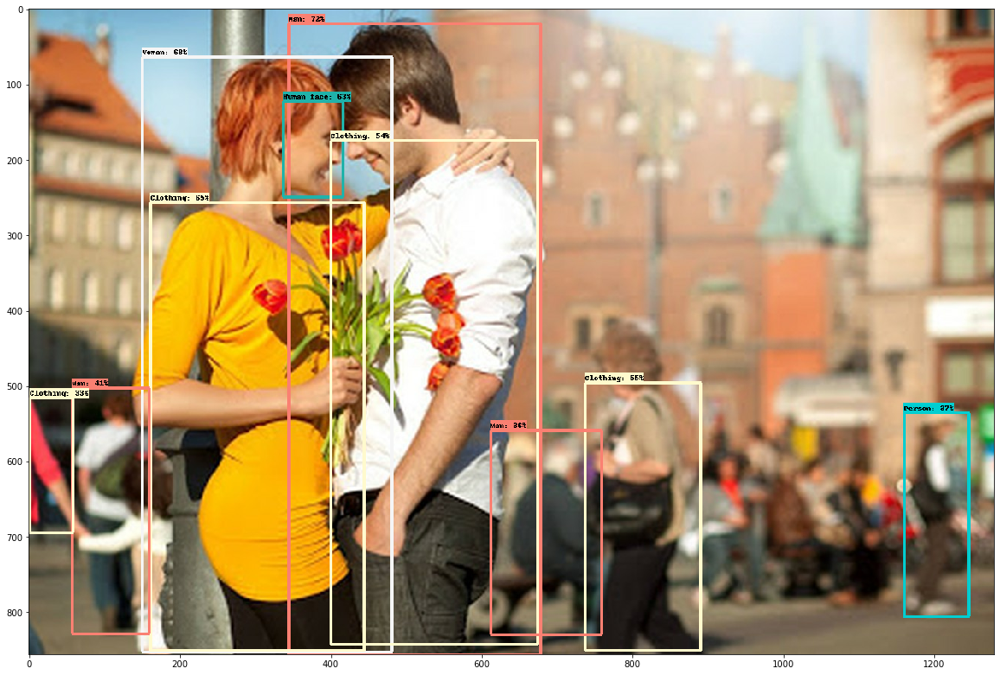

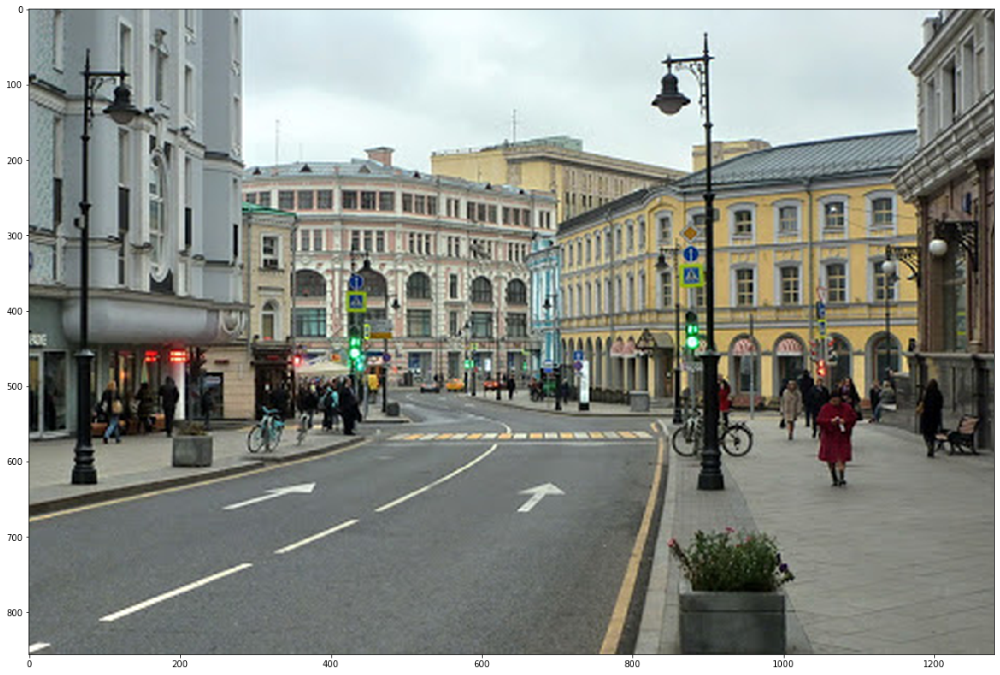

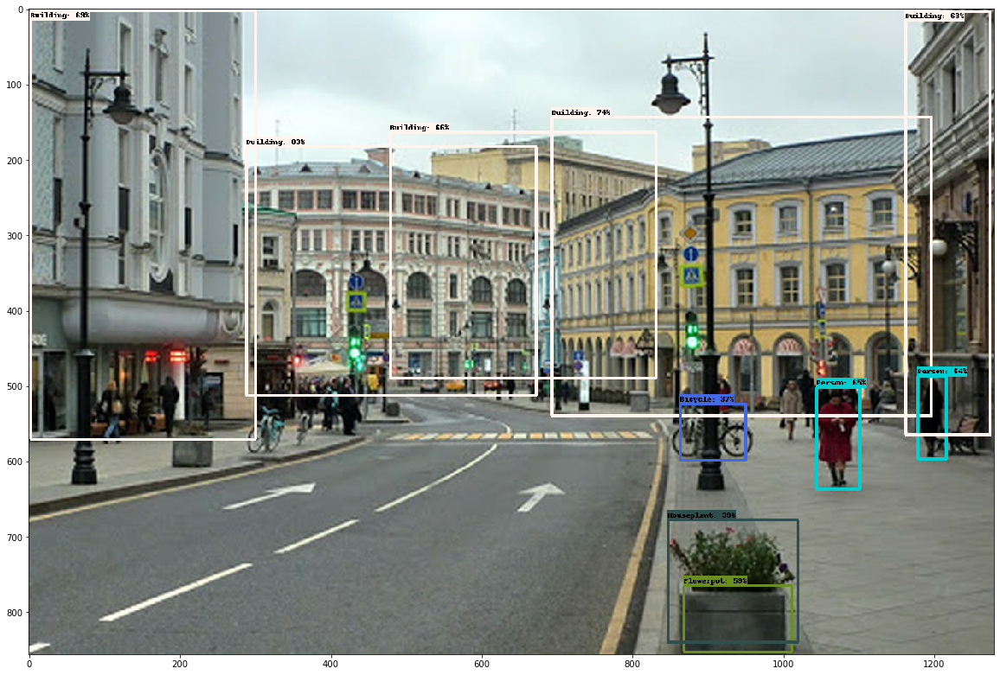

In [17]:
for img in image_urls:
    detect_img(img)

In [18]:
gc.collect()

20610

### Сравним способности на мобильной версии сети:

In [19]:
module_handle_mob = "https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1"# - мобильный.
detector_mob = hub.load(module_handle).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


##### полная версия

Found 100 objects.
Inference time:  1.2422072887420654
Font not found, using default font.


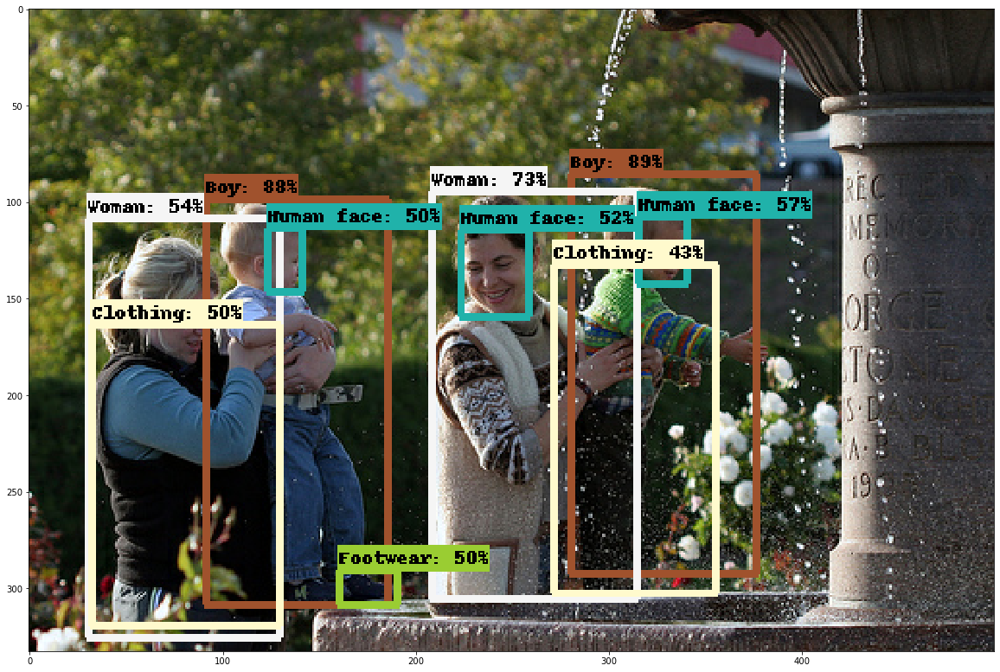

In [23]:
# detect_img(image_urls_fl[0])
run_detector(detector, '1392579828_ab5a139052.jpg')

##### мобильная версия

Found 100 objects.
Inference time:  1.1718206405639648
Font not found, using default font.


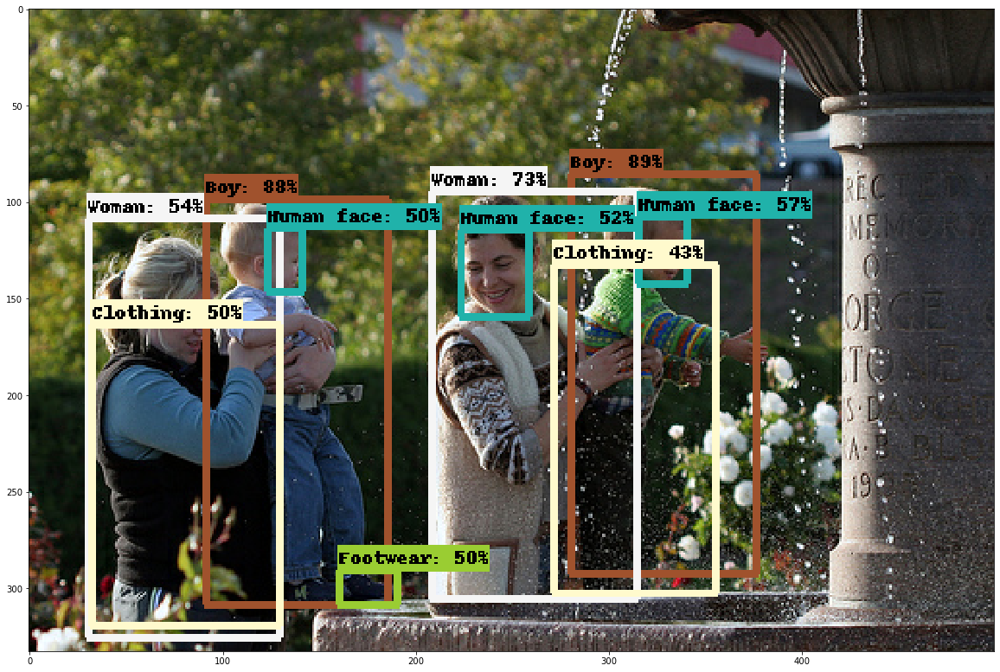

In [24]:
run_detector(detector_mob, '1392579828_ab5a139052.jpg')

In [25]:
gc.collect()

7034

# Выводы

Модель выполняет основные функции по детекции объектов. У мобильной версии это получается достаточно неплохо, хотя часть нечеких изображеий она может пропустить.

Требуется значительный объем оперативной памяти при раоте с полной версией.
В перспективе обучение моделей для распознования видов конкретных предметов (например сортов цветов, хотя она и так иногда их выделяет)